- Satheesh D M

- MA24M023

- Task - 1 Canny Edge Detector

In [32]:
# Library imports
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter, convolve
import os

# Helper functions
def rgb2gray(image):
    """Convert RGB image to grayscale."""
    return np.dot(image[..., :3], [0.2989, 0.5870, 0.1140])

def sobel_filters(image):
    """Compute Sobel gradients."""
    Kx = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
    Ky = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]])

    Gx = convolve(image, Kx)
    Gy = convolve(image, Ky)

    G = np.hypot(Gx, Gy)  # Gradient magnitude
    theta = np.arctan2(Gy, Gx) * (180.0 / np.pi) % 180  # Convert to 0-180 degrees

    return G, theta

def non_maximum_suppression(gradient, theta):
    """Apply Non-Maximum Suppression with subpixel interpolation."""
    M, N = gradient.shape
    suppressed = np.zeros((M, N), dtype=np.float32)

    # Define angle bins for discretization
    angle_bins = np.array([0, 22.5, 67.5, 112.5, 157.5, 180])
    direction = np.digitize(theta, angle_bins) - 1

    for i in range(1, M - 1):
        for j in range(1, N - 1):
            # Get neighboring pixels using subpixel interpolation
            if direction[i, j] in [0, 4]:  # Horizontal (0°)
                q = gradient[i, j + 1]
                r = gradient[i, j - 1]
            elif direction[i, j] == 1:  # Diagonal (45°)
                q = gradient[i + 1, j - 1]
                r = gradient[i - 1, j + 1]
            elif direction[i, j] == 2:  # Vertical (90°)
                q = gradient[i + 1, j]
                r = gradient[i - 1, j]
            else:  # Diagonal (135°)
                q = gradient[i - 1, j - 1]
                r = gradient[i + 1, j + 1]

            # Subpixel interpolation
            subpixel_q = (q + r) / 2.0

            # Suppress non-maximum pixels
            if gradient[i, j] >= subpixel_q:
                suppressed[i, j] = gradient[i, j]

    return suppressed

def threshold(image, low, high):
    """Apply double thresholding."""
    strong = 255
    weak = 75

    strong_i, strong_j = np.where(image >= high)
    weak_i, weak_j = np.where((image <= high) & (image >= low))

    output = np.zeros_like(image, dtype=np.uint8)
    output[strong_i, strong_j] = strong
    output[weak_i, weak_j] = weak

    return output, strong, weak

def hysteresis(image, strong, weak):
    """Apply edge tracking by hysteresis with an 8-neighborhood approach."""
    rows, cols = image.shape
    output = image.copy()

    for i in range(1, rows - 1):
        for j in range(1, cols - 1):
            if output[i, j] == weak:
                # Check if any of the 8 neighbors is a strong edge
                if (strong in output[i-1:i+2, j-1:j+2]):
                    output[i, j] = strong  # Promote weak edge to strong
                else:
                    output[i, j] = 0  # Suppress weak edge

    return output

def canny_edge_detection(image, sigma=1.4, low=20, high=40):
    """Full Canny Edge Detection Pipeline."""
    gray = rgb2gray(image)
    blurred = gaussian_filter(gray, sigma)
    gradient, theta = sobel_filters(blurred)
    suppressed = non_maximum_suppression(gradient, theta)
    thresholded, strong, weak = threshold(suppressed, low, high)
    final_edges = hysteresis(thresholded, strong, weak)

    return final_edges

###########################################
### CUSTOM FUNCTION FOR DIFFERENT SIGMA ###
###########################################
def canny_different_sigma(image, sigma):
    image_path = os.path.join("archive/images/test", image)
    ground_truth_path = os.path.join("archive/ground_truth_boundaries/test", image)
    image = plt.imread(image_path)
    ground_truth = plt.imread(ground_truth_path)
    
    edges = canny_edge_detection(image, sigma)

    # Show results
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(image, cmap='gray')
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(edges, cmap='gray')
    plt.title(f"Canny Edge Detection, $\sigma = {sigma: .2f}$")
    plt.axis("off")
    
    plt.subplot(1, 3, 3)
    plt.imshow(ground_truth, cmap='gray')
    plt.title("Ground Truth")
    plt.axis("off")

    plt.show()

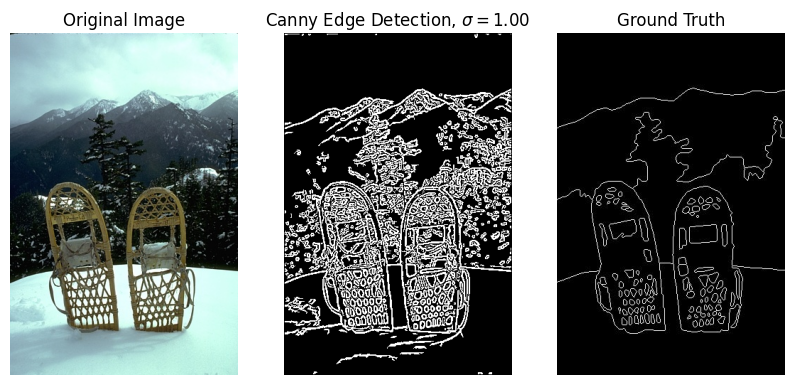

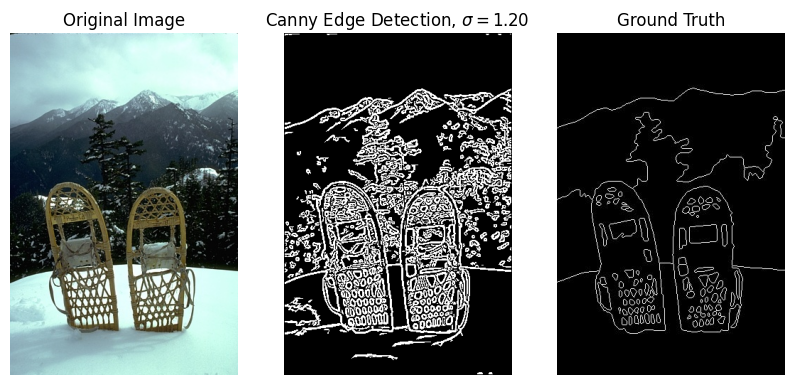

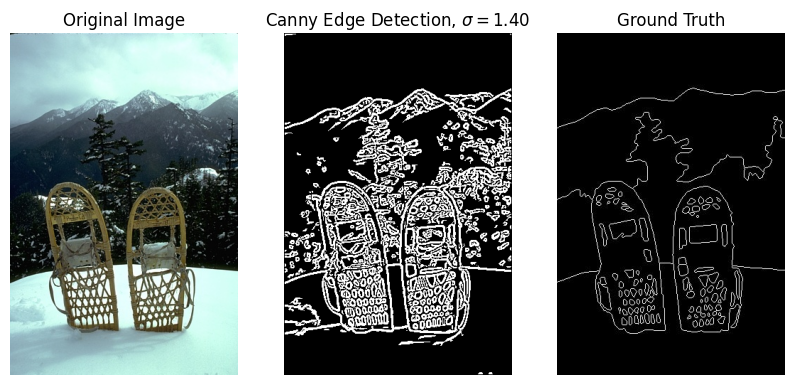

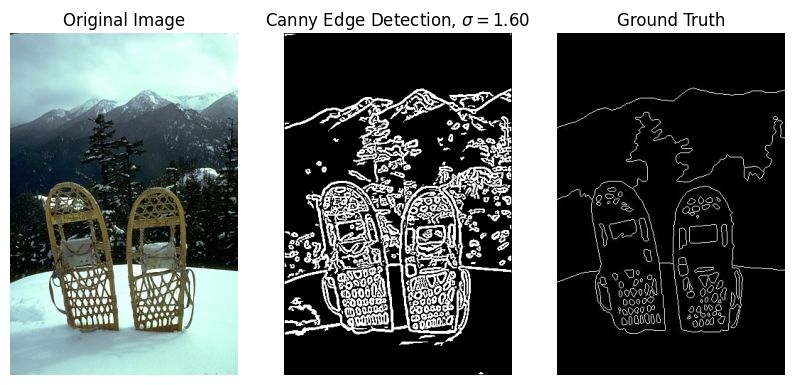

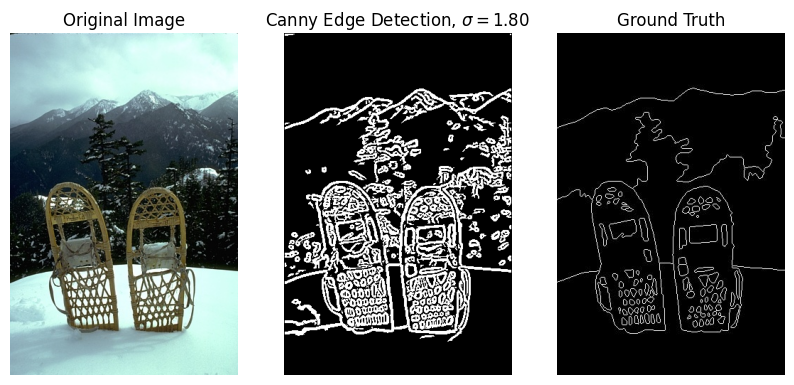

...

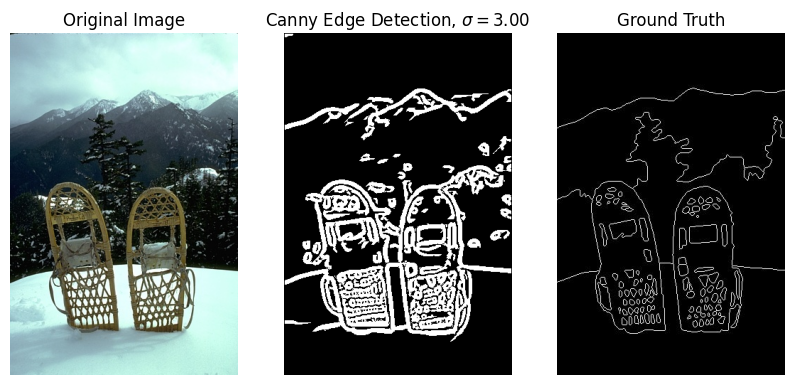

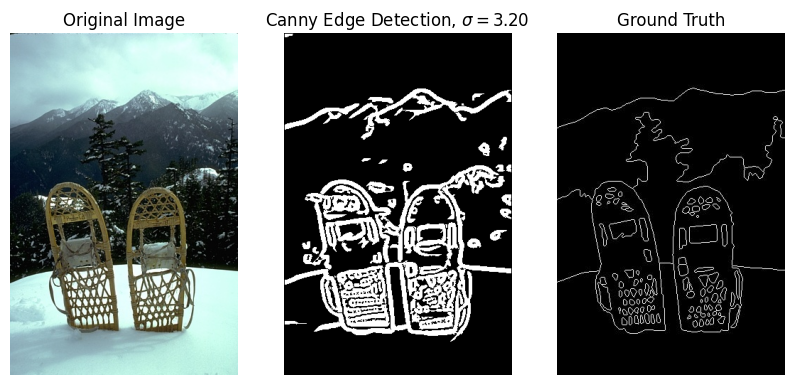

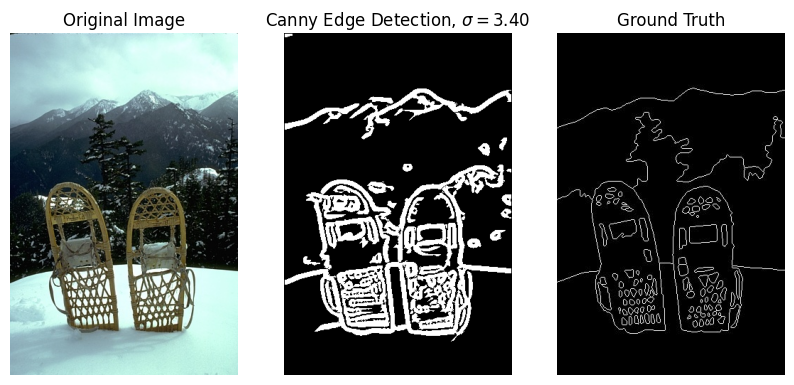

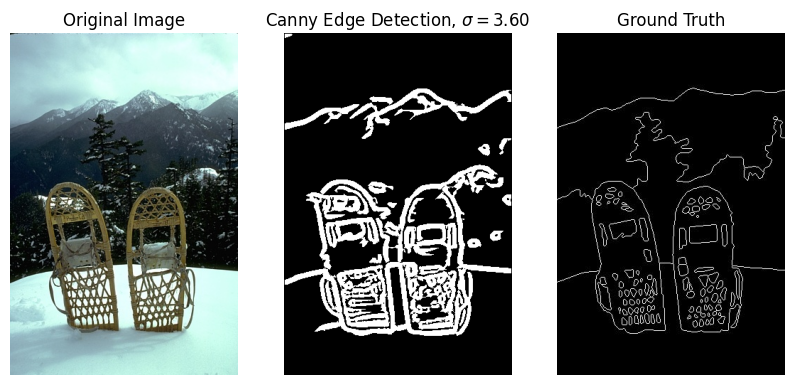

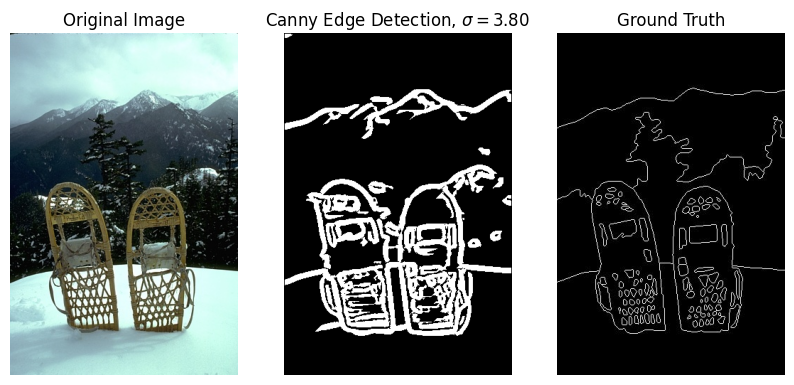

In [33]:
for i in range(15):
    canny_different_sigma(f"2018.jpg", (i*0.2 + 1))

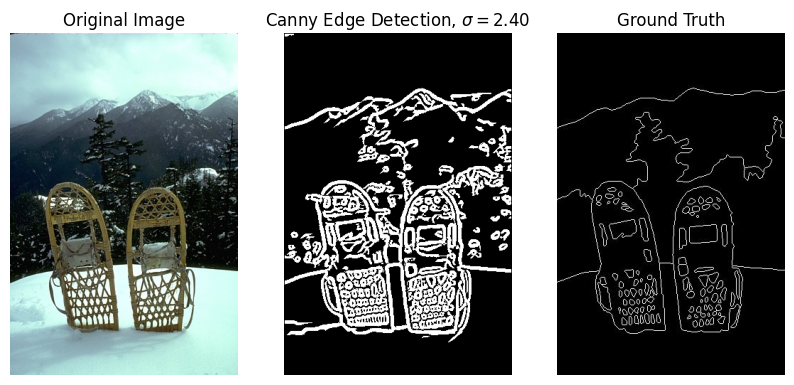

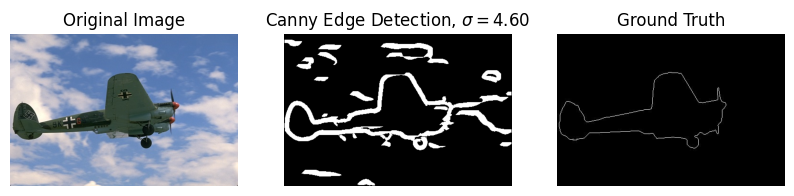

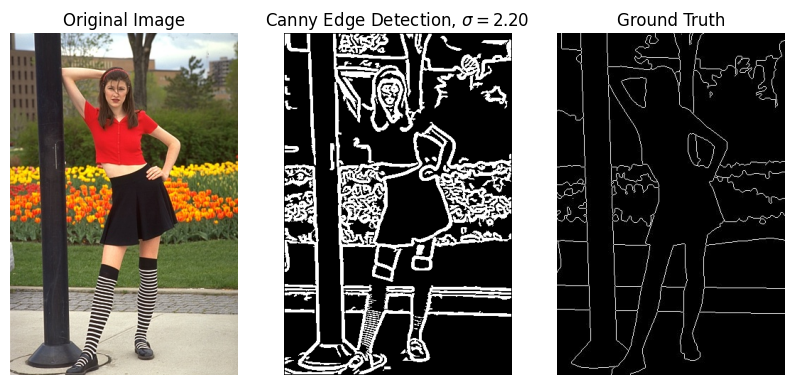

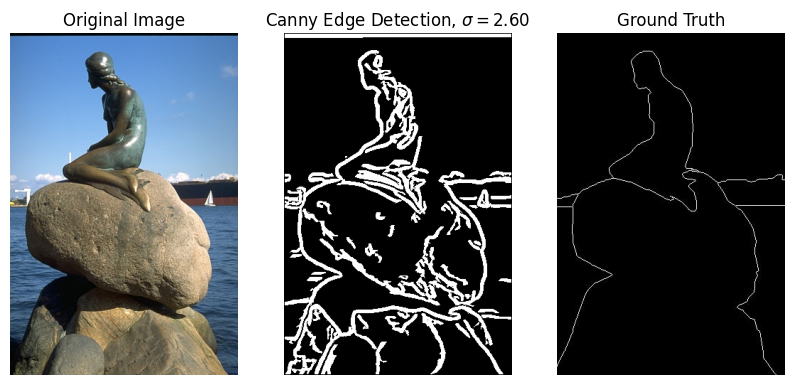

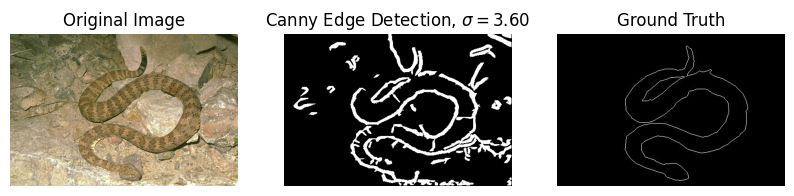

In [41]:
canny_different_sigma(f"2018.jpg", 2.4) 
canny_different_sigma(f"3063.jpg", 4.6)
canny_different_sigma(f"388067.jpg",2.2)
canny_different_sigma(f"372019.jpg",2.6)
canny_different_sigma(f"87015.jpg", 3.6)

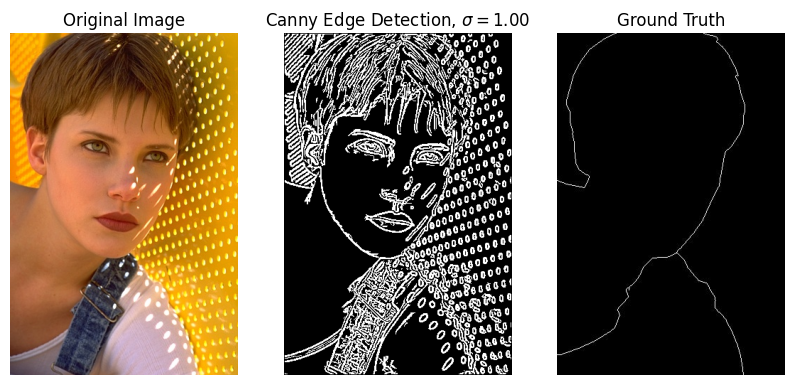

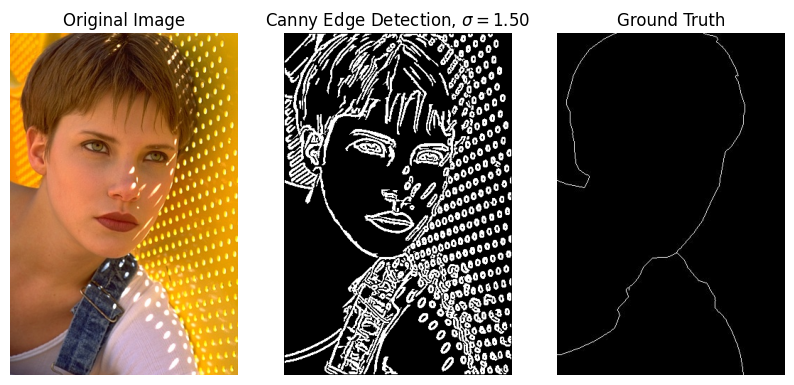

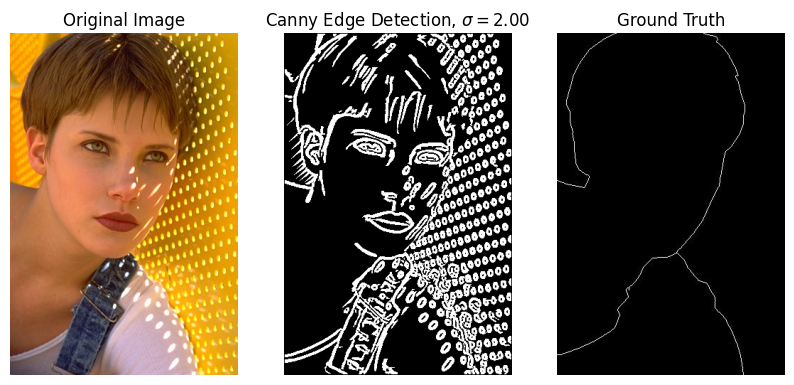

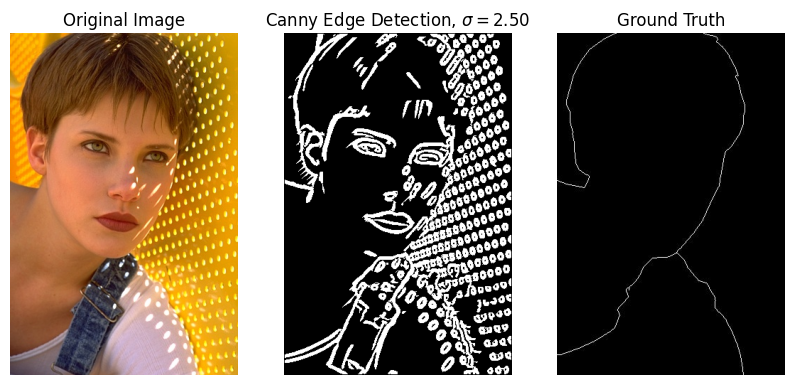

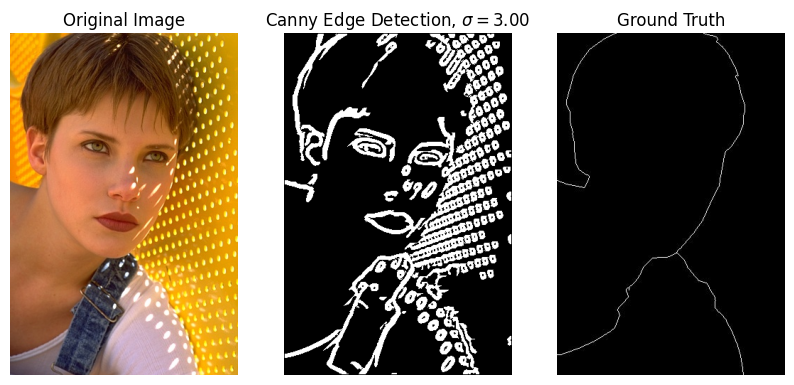

...

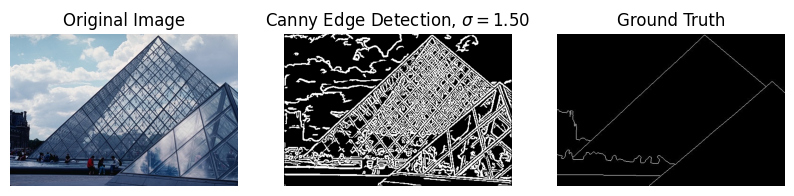

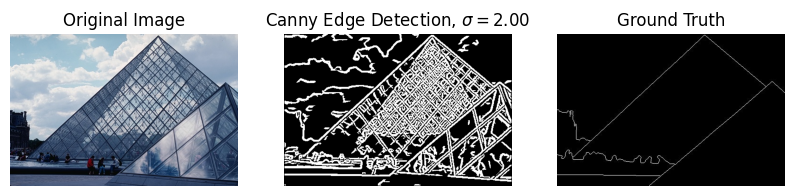

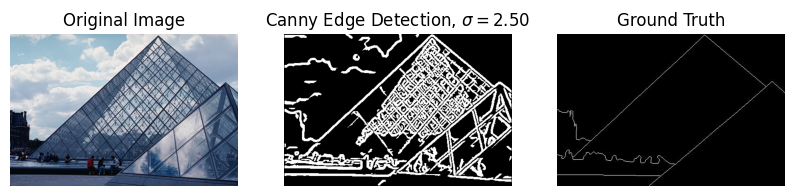

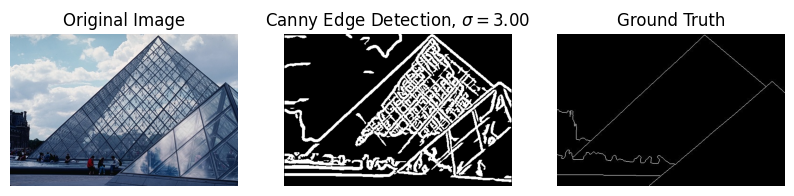

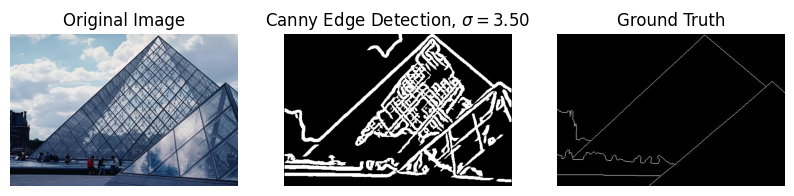

In [46]:
for i in range(6):
    canny_different_sigma(f"388006.jpg", (i*0.5 + 1))
    
for i in range(6):
    canny_different_sigma(f"288024.jpg", (i*0.5 + 1))
    
for i in range(6):
    canny_different_sigma(f"208078.jpg", (i*0.5 + 1))

for i in range(6):
    canny_different_sigma(f"223060.jpg", (i*0.5 + 1))